In [3]:
import cv2  #Conda install opencv, might degrade the h5py and hdf5 packages
import datetime as dt
import os

import matplotlib.pylab as plt
import numpy as np
import pandas as pd

import tensorflow as tf
from keras import models, layers, optimizers, callbacks
from keras.layers import (Input, Dense,Conv2D, MaxPooling2D, UpSampling2D,
                          Activation, BatchNormalization, Concatenate,
                          Flatten)
from keras.models import Model, load_model
import matplotlib.image as mpimg
from keras.preprocessing.image import (load_img, img_to_array, 
                                       ImageDataGenerator)
from pathlib import Path
from keras.utils import plot_model

# from vis.utils import utils
import keras.backend as K
from IPython.display import Image, clear_output

Using TensorFlow backend.


# Load the dataset

We will be using the cat and bog dataset. It can be found at any one of these wedpages

https://www.microsoft.com/en-us/download/details.aspx?id=54765

https://www.kaggle.com/c/dogs-vs-cats/data

In [4]:
path = os.path.join(os.getcwd(),'cats_and_dogs_small')
test_dir = Path(path+'/test/')
validation_dir = Path(path+'/validation/')
train_dir = Path(path+'/train/')

print('total training cat folders:', len(os.listdir(train_dir)))
print('total test cat folders:', len(os.listdir(test_dir)))
print('total validation cat folders:', len(os.listdir(validation_dir)))

total training cat folders: 2
total test cat folders: 2
total validation cat folders: 2


(281, 300, 3)


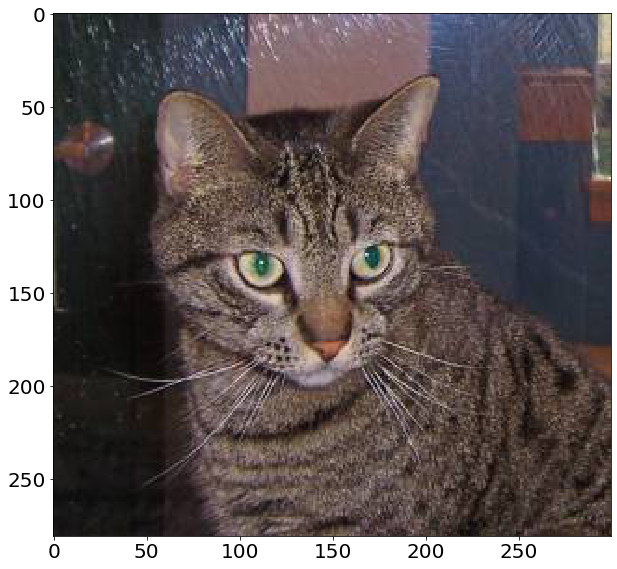

In [5]:
img = mpimg.imread(Path(path+'/train/cats/cat.1.jpg'))
print(img.shape)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 
plt.figure(figsize = (10,10))
plt.imshow(img);


# Utility functions

In [6]:
def graphHistory(history, title='',metrics=['loss'], fontsize=20,
                linewidth=5,figsize=(10,10)):
    '''Function for graphing the training and valiedation accuracy and loss'''
    
    # Plot history for different metrics 
    for strText in metrics:
        fig = plt.figure()
        plt.figure(figsize = figsize)
        plt.plot(history.history[strText], linewidth=linewidth)
        
        try:
            plt.plot(history.history['val_'+strText],linewidth=linewidth )
            plt.legend(['Tr. '+strText, 'Val. '+strText], 
                       fontsize =fontsize)
        except:
            plt.legend(['Tr. '+strText],fontsize =fontsize)
                        
        plt.title('MODEL '+strText.upper() + title,fontsize =fontsize)
        plt.ylabel(strText.upper(),fontsize=fontsize)
        plt.xlabel('Epoch',fontsize=fontsize)           
        plt.show()

        
def save_model(model, save_dir=os.path.join(os.getcwd(), 'saved_models'),
                   model_file_name='model.h5'):
    """
    Save model and current weights
    :param model: Keras model
    :param save_dir: path name to save directory
    :param model_file_name: filename for saved model
    :return: nothing
    """
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
    model_path = os.path.join(save_dir, model_file_name)
    model.save(model_path)
    print('Saved trained model at %s ' % model_path)
    
    
def loadmodel(model_file_name, directory='saved_models'):
    # Load model and weights
    if not os.path.isdir(directory):
        os.makedirs(directory)
    model_path = os.path.join(directory, model_file_name)
    model = load_model(model_path)
    print('Loaded trained model from %s ' % model_path)
    return model    

def get_random_noise(p=.5, a = .1):
    '''
    Input:
    p: floating point representing the probablity of cutout
    '''

    def AWGN(input_img):
        p_1 = np.random.rand() #Random probability

        if p_1 > p:
            return input_img/255.
        
        img = input_img.copy()/255. + a*np.random.uniform(0, 1,
                                                     size=input_img.shape)
        return np.clip(img,0.0,1.0)

    return AWGN

class trackProgress(callbacks.Callback):
    ''' Track training progress of the model
    
    '''
    def __init__(self,linewidth=4,figsize=(15,8),
                    tick_size=20,fontsize=20, metric = 'acc'):
        
        self.linewidth = linewidth
        self.figsize = figsize
        self.tick_size = tick_size
        self.fontsize = fontsize
        self.metric = metric
                  
    def on_train_begin(self, logs={}):
        self.i = 1
        self.x = []
        self.losses = []
        self.val_losses = []
        self.acc = []
        self.val_acc = []
        
        self.fig = plt.figure()
        self.logs = []
        
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(logs)
        self.x.append(self.i)
        
        if self.metric == 'mse':
            metric = 'mean_squared_error'
        elif self.metric == 'acc':
            metric = 'acc'
        else:
            metric  = self.metric
            
        #Store the losses
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        
        self.acc.append(logs.get(metric))
        self.val_acc.append(logs.get('val_'+metric))
        
        self.i += 1 #Increment the epoch number
        
        plt.rc('xtick', labelsize=self.tick_size) 
        plt.rc('ytick', labelsize=self.tick_size) 
    
        fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True,
                                    figsize=self.figsize)
        
        clear_output(wait=True)
        plus =  6
        
        #Plot the metrics
        ax1.plot(self.x, self.losses, label="loss",
                 linewidth=self.linewidth)
        ax1.plot(self.x, self.val_losses, label="val_loss",
                linewidth=self.linewidth)
        
        ax1.set_title('Model Loss', fontsize =self.fontsize+plus)
        ax1.set_xlabel('Epochs',fontsize =self.fontsize+plus)
        ax1.set_ylabel('Loss',fontsize =self.fontsize+plus)
        ax1.legend(fontsize =self.fontsize)
        
        ax2.plot(self.x, self.acc, label=metric,
                 linewidth=self.linewidth)
        ax2.plot(self.x, self.val_acc, label="val_"+metric,
                linewidth=self.linewidth)
        
        ax2.set_title('Model '+metric, fontsize =self.fontsize+plus)
        ax2.set_xlabel('Epochs',fontsize =self.fontsize+plus)
        ax2.set_ylabel(metric ,fontsize =self.fontsize+plus)
        ax2.legend(fontsize =self.fontsize)
        
        fig.tight_layout()
        plt.show();
        

# Image generators for image compress

Found 1000 images belonging to 1 classes.
Found 500 images belonging to 1 classes.
Found 500 images belonging to 1 classes.


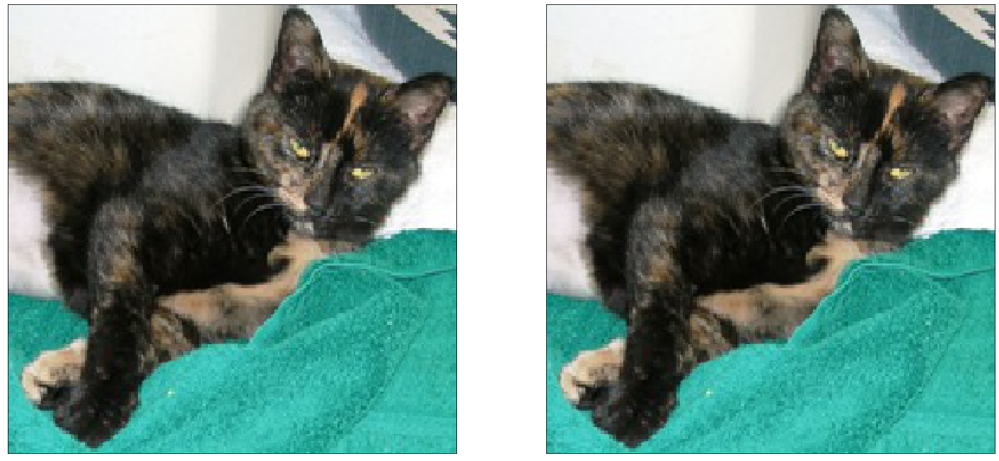

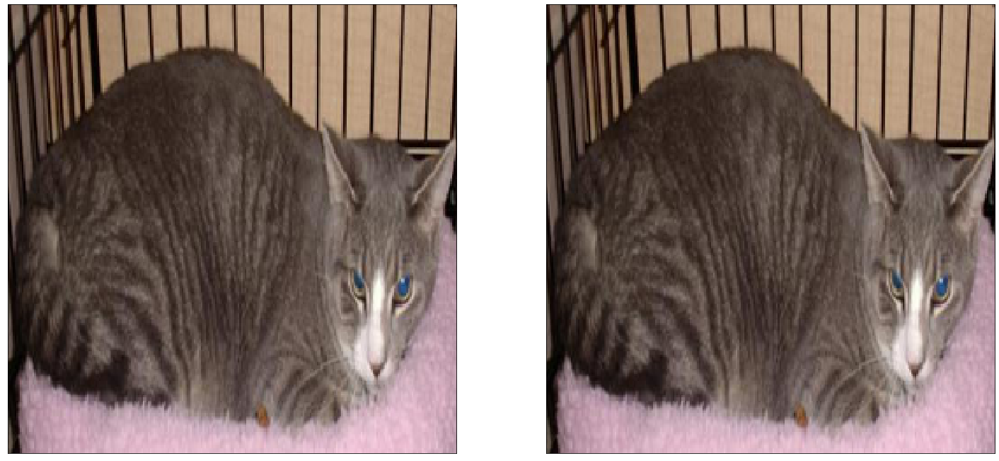

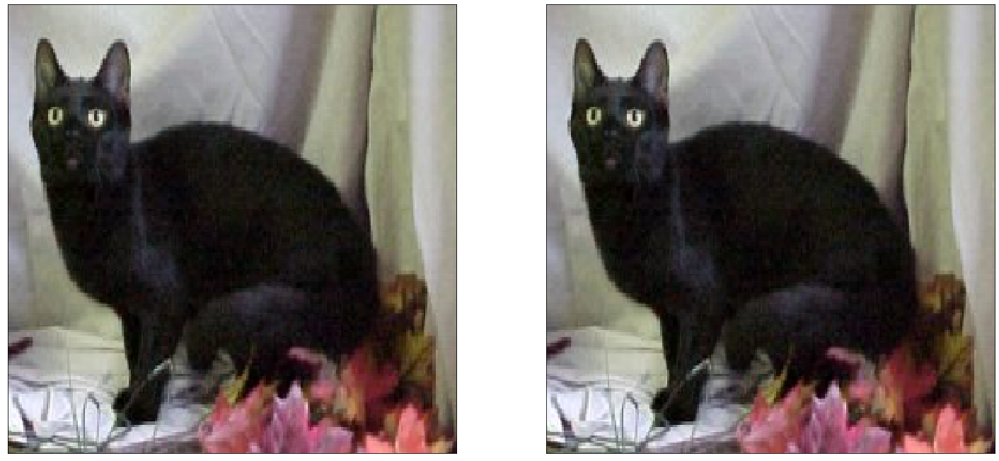

In [7]:
train_datagen1      = ImageDataGenerator(rescale=1./255)
test_datagen1       = ImageDataGenerator(rescale=1./255)    
validation_datagen1 = ImageDataGenerator(rescale=1./255)

return_num = 8
downSize = (256,256)   #Size of the output images

train_gen = train_datagen1.flow_from_directory(
    train_dir,
    target_size = downSize,
    batch_size  =  return_num, 
    class_mode  = 'input',     #Return two images at a time
    classes     = ['cats'])

validation_gen = validation_datagen1.flow_from_directory(
    validation_dir,
    target_size = downSize,
    batch_size  =  return_num, 
    class_mode  = 'input',
    classes     = ['cats'])

test_gen = test_datagen1.flow_from_directory(
    test_dir,
    target_size = downSize,
    batch_size  =  return_num,  
    class_mode  = 'input',
    classes     = ['cats'])


#Keep track of the samples for computing batch sizes
validation_samples =  validation_gen.samples
train_samples      =  train_gen.samples


for data_batch, labels_batch in train_gen:
   
    n = 3
    for i in range(n):
        plt.figure(figsize=(25,25))
        ax = plt.subplot(121)
        plt.imshow(data_batch[i])
    
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        
        ax = plt.subplot(122)
        plt.imshow(labels_batch[i])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    break
plt.show()

Remember that for compression you what to feed the same image as input and label to train the autoencoder

# U-net Architecture

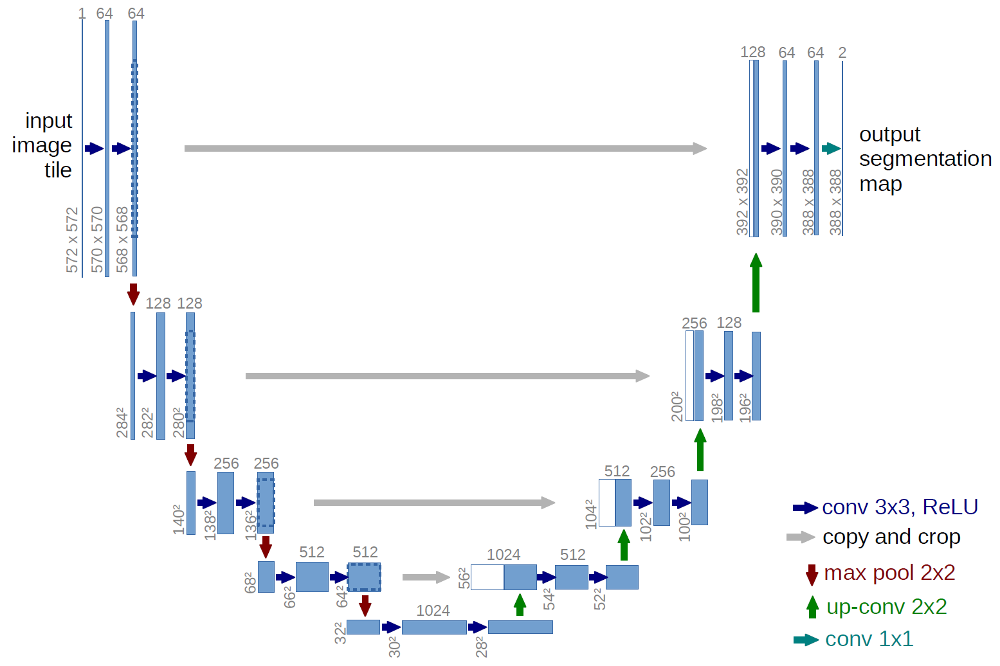

https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/

In [10]:
def encoder_block(x, filters, kernel_size=(3,3), padding='same',
              strides=1, activation = 'relu'):
    
    c = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              activation=activation, strides=strides)(x)

    skip = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              activation=activation, strides=strides)(c)
        
    out = MaxPooling2D((2,2),(2,2))(skip)
    
    return skip, out






def bottleneck(x,filters, kernel_size=(3,3),padding='same',
              strides = 1):
    
    out = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              strides=strides, activation='relu',name='bottleneck1')(x)
    out = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              strides=strides, activation='relu',name='bottleneck2')(out)
    return out








def  decoder_block(x, skip, filters, kernel_size=(3,3), padding='same',
            strides=1):
    
    us = UpSampling2D((2,2))(x)
    concat = Concatenate()([us, skip])
    
    out = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              strides=strides, activation='relu')(concat)
    out = Conv2D(filters, kernel_size=kernel_size, padding=padding,
              strides=strides, activation='relu')(out)
    return out



    


def UNET(input_shape, f, activation = None):
    """Compiles a simple deep CNN: with conv, maxpool, dropout
    :param input_shape: tensor shape of the input (not including observation count)
    (3 dim for 3 channel color images)
    :param num_classes: name of the h5 file containing the trained model params
    :param batch_size=32: size of the batches used for training
    :return: compiled model
    """
    inputs = Input(input_shape)  #(256,256,3)
    
    p0 = inputs
    s1, p1 = encoder_block(p0,f[0],activation=activation) #128 ->64
    s2, p2 = encoder_block(p1,f[1],activation=activation)
    s3, p3 = encoder_block(p2,f[2],activation=activation)
    s4, p4 =encoder_block(p3,f[3],activation=activation)
    
    bn = bottleneck(p4,f[4])
    
    u1 =  decoder_block(bn, s4, f[3])
    u2 =  decoder_block(u1, s3, f[2])
    u3 =  decoder_block(u2, s2, f[1])
    u4 =  decoder_block(u3, s1, f[0])
    
    #At the final layer a 1×1 convolution is used to map each 16- component 
    #feature vector to the desired number of classes but im outputting 
    #a 3 
    outputs = Conv2D(3,(1,1), padding ='same', activation='sigmoid')(u4)

    model = Model(inputs, outputs)

    return model

In [11]:
f = [16, 32, 64, 128, 256]
model = UNET((256,256,3),f, activation ='relu')
model.compile(optimizer="adam", 
              loss="binary_crossentropy", 
              metrics=["acc"])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 256, 256, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 256, 256, 16) 2320        conv2d_3[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_2 (MaxPooling2D)  (None, 128, 128, 16) 0           conv2d_4[0][0]                   
__________________________________________________________________________________________________
conv2d_5 (

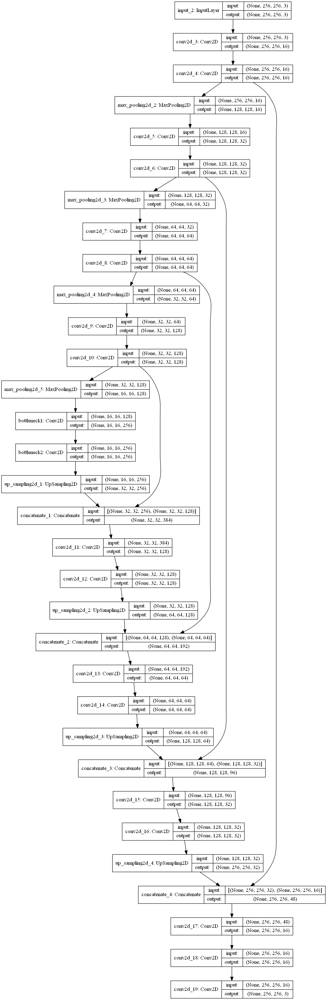

In [12]:
plot_model(model, show_shapes=True,to_file='unet.png')
Image(filename='unet.png')

In [20]:
def train_net(model, imgGen, valGen, epochs=10, saveBest = False,
             verbose=False, patience=2, batch_size = 32, metric='acc'):
    
    # time stamp
    timeStamp = dt.datetime.now().strftime("%Y%m%d-%H%M%S")


    #Plot training and validation curves as we go and use them to 
    #help decide whether to stop training or keep training
    plot_progress = trackProgress(linewidth=8,figsize=(15,8),
                    tick_size=20,fontsize=20, metric = metric)

    #Creating a checkpointer 
    checkpointer = callbacks.ModelCheckpoint(
        filepath='saved_models/unet_{}.h5'.format(timeStamp),
        verbose=verbose, save_best_only=True)

    #Adding EarlyStopping by monitoring the validation loss
    stopEarly = callbacks.EarlyStopping(monitor='loss', mode='min', 
                       verbose=verbose,patience=patience)

    if saveBest:
        callback = [stopEarly, checkpointer, plot_progress]
    else:
        callback = [stopEarly, plot_progress]



    history = model.fit_generator(imgGen,
                             steps_per_epoch=int(np.ceil(train_samples/return_num)),
                             epochs=epochs,
                             verbose=verbose,
                             validation_data=valGen,
                             validation_steps=int(np.ceil(validation_samples/return_num)),
                             callbacks = callback,
                             shuffle = True
                             )

    return model, history

def test_model(model, test_generator):
    for data_batch, labels_batch in test_generator:

        decoded_imgs = model.predict(data_batch)    
        n = 8
        for i in range(n):
            plt.figure(figsize=(25,25))

            '''Plot original image'''
            ax = plt.subplot(121)
            plt.imshow(data_batch[i])

            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)


            if decoded_imgs is not None:
                if i == 0:
                    plt.title("Original Image",fontsize =60)

                ax = plt.subplot(122)

                if i == 0:
                    plt.title("Decoded Image",fontsize =60)

                '''Plot the Decoded Image'''
                plt.imshow(decoded_imgs[i])

                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
        break
    plt.show()

def evaluate_model(model, test_generator):
    
    for X, y in test_generator:
       
        # report evaluation metrics
        evaluation = model.evaluate(X,y)
        print('Model Accuracy = %.6f' % (evaluation[1]))
        print('Model Loss = %.6f ' % evaluation[0]) 

        break #Break after one batch

# Train U-net for image compression and decompression

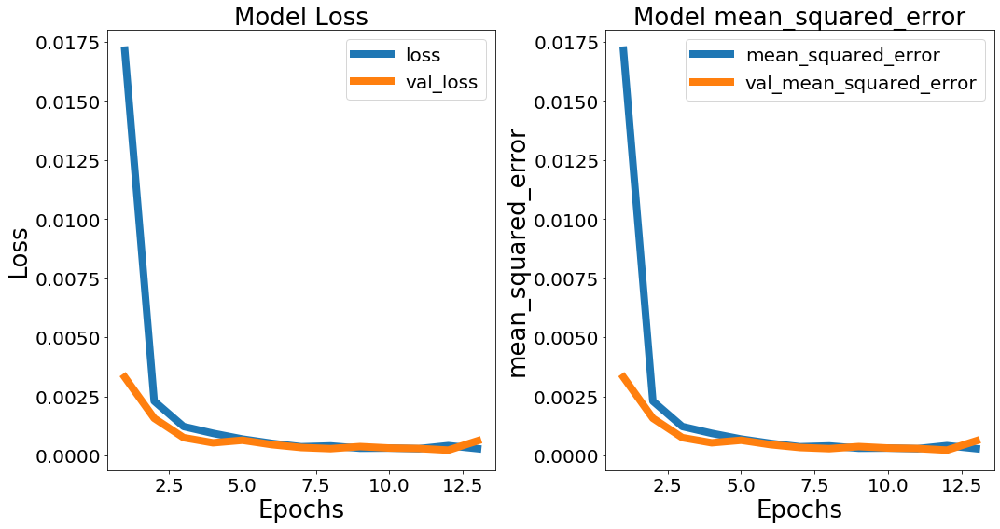

Epoch 00013: early stopping
Wall time: 24min 55s


(<keras.engine.training.Model at 0x1b5d1bc1b38>,
 <keras.callbacks.History at 0x1b5d1bd8cf8>)

In [58]:
%%time
f = [16, 32, 64, 128, 256]
model = UNET((256,256,3),f, activation ='relu')
model.compile(optimizer="adam", 
              loss="mse",  
              metrics=["mse"])

train_net(model, train_gen, validation_gen,
         epochs=50, saveBest = True,
             verbose=1, patience=2, metric='mse')
    

# Testing the recontruction capacity of the U-net


Loaded trained model from saved_models\unet_20190819-105905.h5 
8/8 [==============================] - 1s 99ms/step
Model Accuracy = 0.000325
Model Loss = 0.000325 


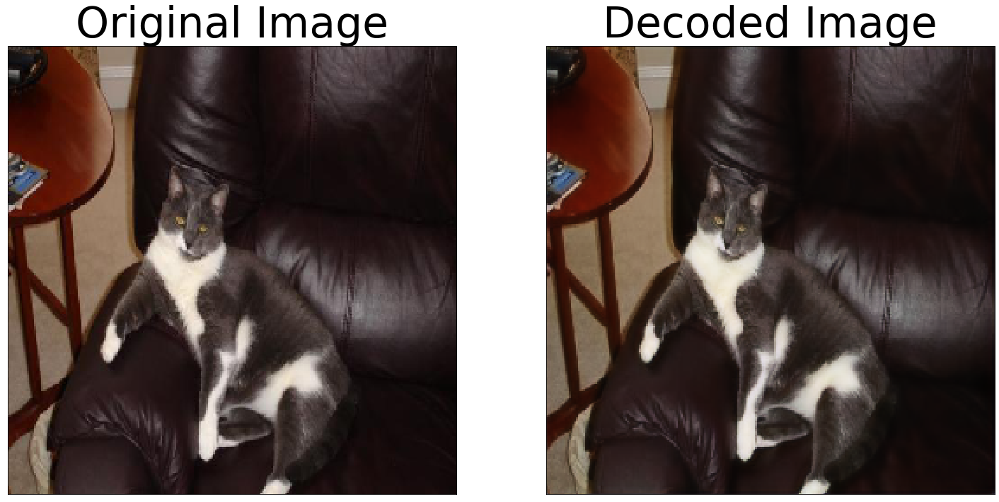

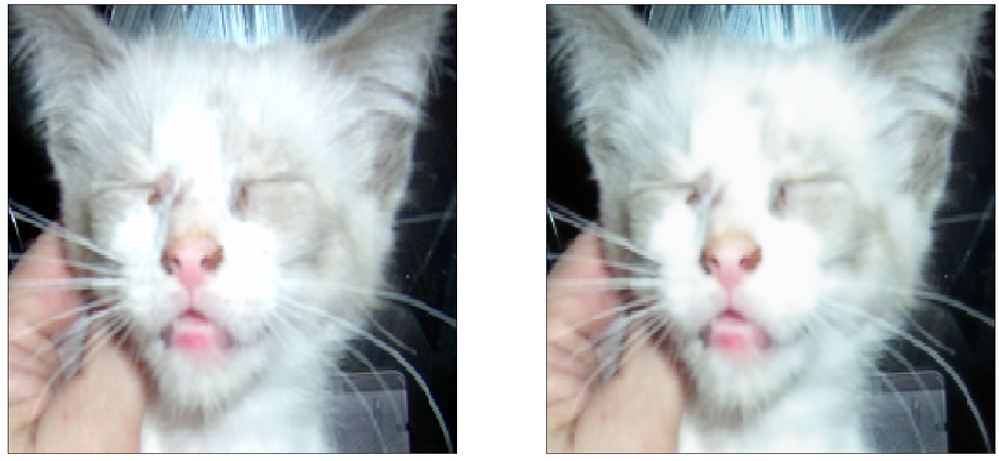

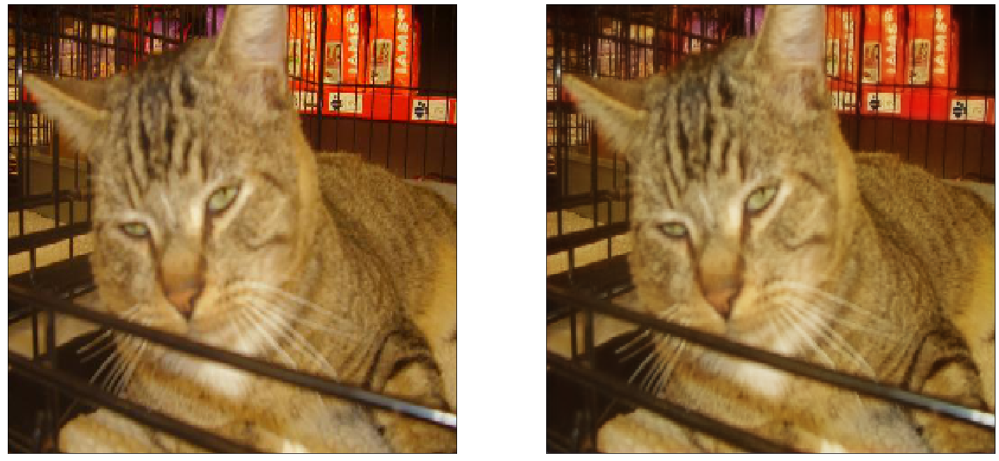

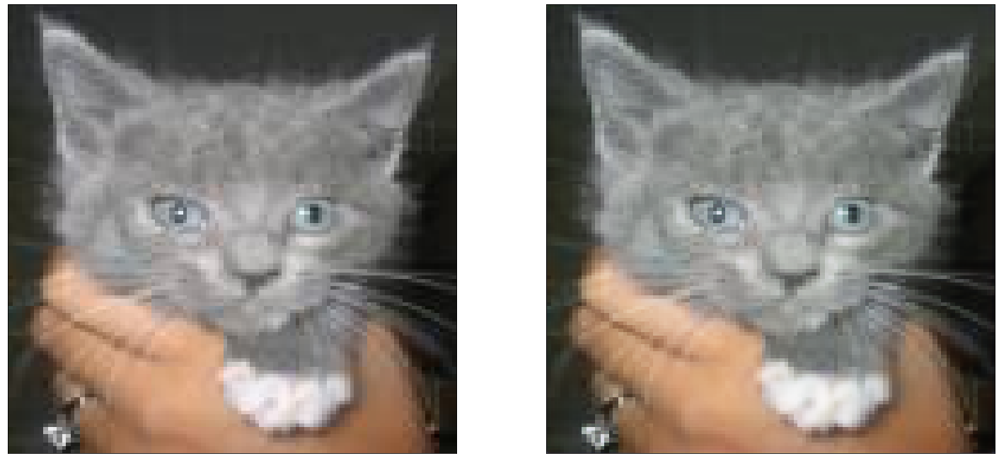

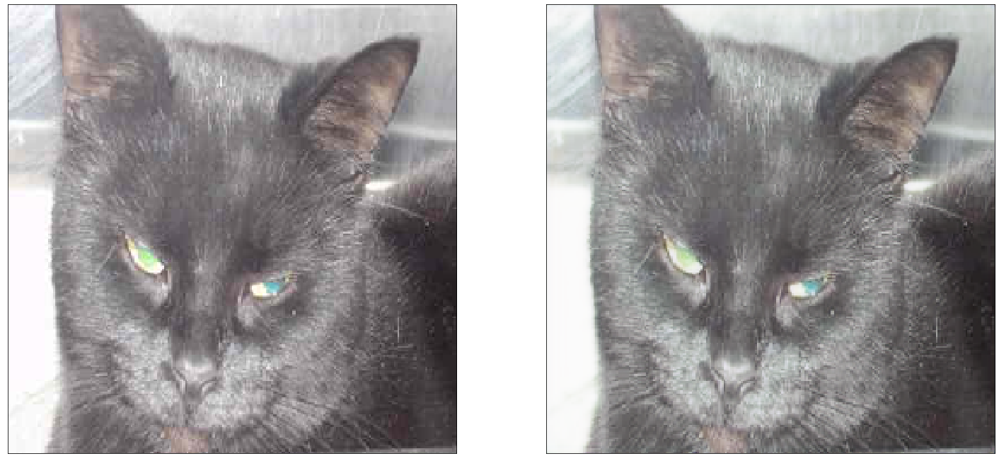

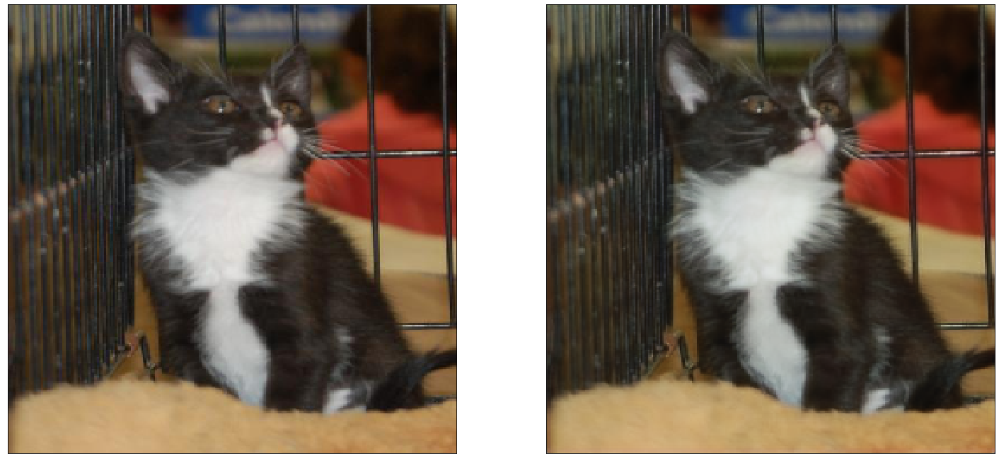

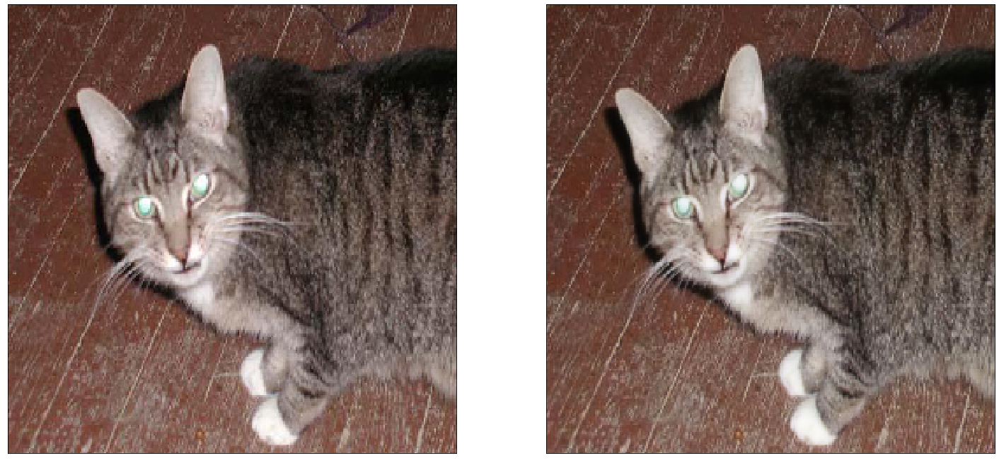

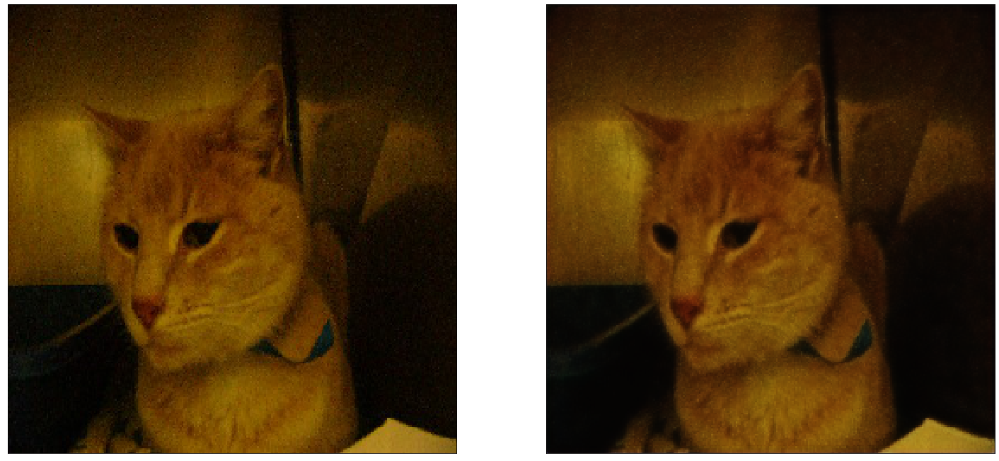

In [24]:
model = loadmodel('unet_20190819-105905.h5')

#Loss and acc of the model
evaluate_model(model, test_gen)

#View the results of compression and decompression
test_model(model, test_gen)

As we can see, U-net does a remarkable job of reconstructing the images from the test set. It learnt body morphology and correct color schemes. Great! So, we were able to reconstruct some cat images. As the excitement soon fades off (if it was even present in the first place), we will want to use autoencoders for more useful and real-world tasks – perhaps tasks such as image denoising, where we commission a network to regenerate an image in its entirety from a corrupted input.



# Generating images and masks

In [15]:
# Normal images
train_datagen       = ImageDataGenerator(rescale=1./255)
test_datagen        = ImageDataGenerator(rescale=1./255)    
validation_datagen  = ImageDataGenerator(rescale=1./255)

train_mask_datagen  = ImageDataGenerator(preprocessing_function=
                                  get_random_noise(p=1, a = .5))  #Custom function that also scaled the image

test_mask_datagen   = ImageDataGenerator(preprocessing_function=
                                  get_random_noise(p=1, a = .5))

val_mask_datagen    = ImageDataGenerator(preprocessing_function=
                                  get_random_noise(p=1, a = .5))

return_num = 8        #Batch size to return 
downSize = (256,256)  #Resize all the images 
seed=1                #Seed for the random generator

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size= downSize, # The standard size of the images
    batch_size=return_num, # NUmber of Images returned per batch
    class_mode = None,     # Return single image and no label
    classes = ['cats'],    # Folder in which the data is located
    seed=seed)             # Commmon seed for the train and the mask generators

train_mask = train_mask_datagen.flow_from_directory(
    train_dir,
    target_size= downSize,
    batch_size=return_num,   
    class_mode =None,
    classes = ['cats'],
    seed=seed
    )

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size= downSize,
    batch_size=return_num, 
    class_mode = None,
    classes = ['cats'],
    seed=seed)


validation_mask = val_mask_datagen.flow_from_directory(
    validation_dir,
    target_size= downSize,
    batch_size=return_num,   
    class_mode =None,
    classes = ['cats'],
    seed=seed
    )

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size= downSize,
    batch_size=return_num,   
    class_mode = None,
    classes = ['cats'],
    seed=seed
    )

test_mask = test_mask_datagen.flow_from_directory(
    test_dir,
    target_size= downSize,
    batch_size=return_num,   
    class_mode =None,
    classes = ['cats'],
    seed=seed
    )

validation_samples =  validation_generator.samples
train_samples      =  train_generator.samples

#Generate noising image and a clean image 
train_w_noise_generator      = zip(train_mask, train_generator)   #Generates two images 
validation_w_noise_generator = zip(validation_mask, validation_generator)
test_w_noise_generator       = zip(test_mask, test_generator)



Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.
Found 500 images belonging to 1 classes.
Found 500 images belonging to 1 classes.
Found 500 images belonging to 1 classes.
Found 500 images belonging to 1 classes.


# Testing the image/data generators

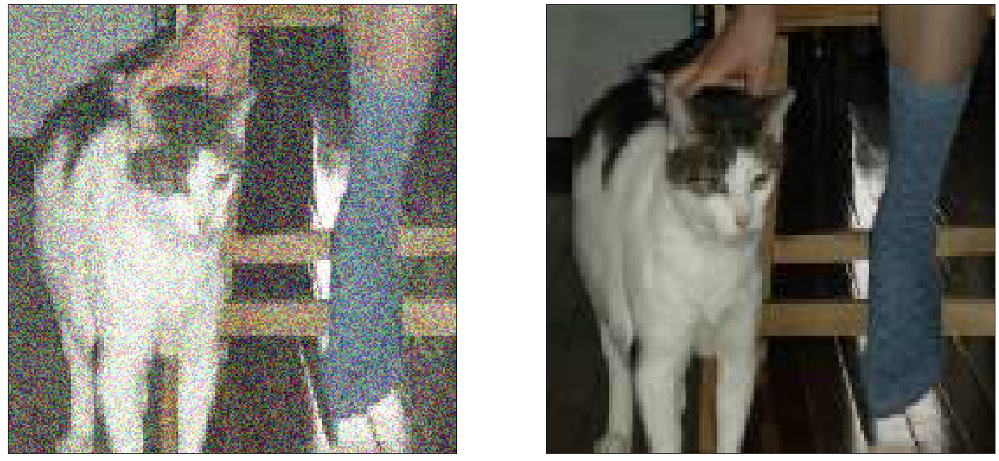

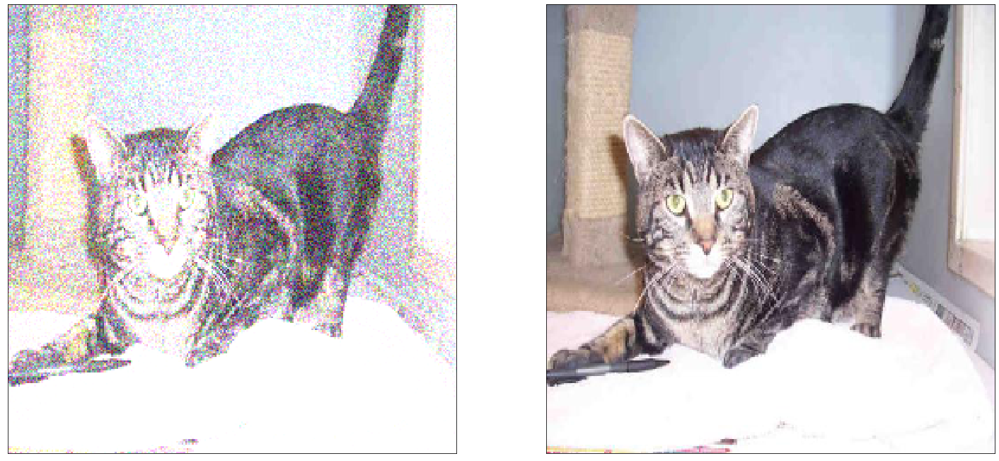

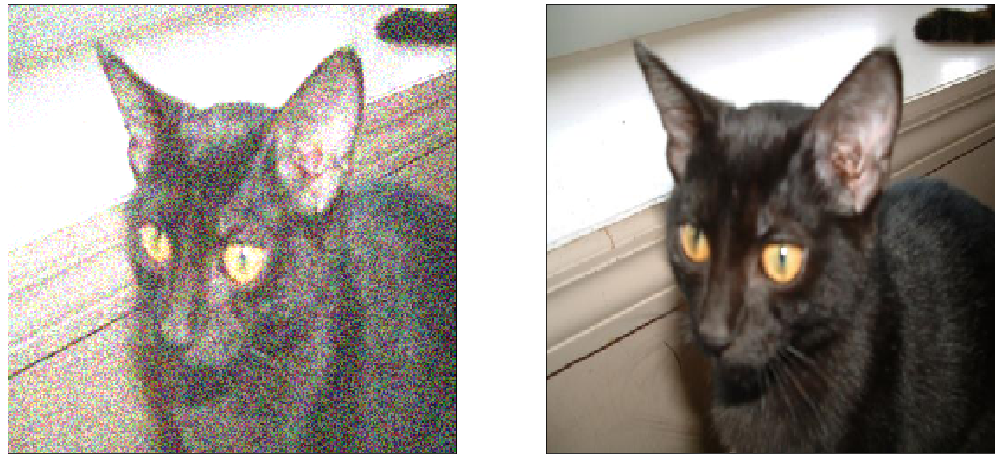

In [18]:

for data_batch, labels_batch in validation_w_noise_generator:
   
    n = 3
    for i in range(n):
        plt.figure(figsize=(25,25))
        ax = plt.subplot(121)
        plt.imshow(data_batch[i])
    
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        
        ax = plt.subplot(122)
        plt.imshow(labels_batch[i])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    break
plt.show()

# Train U-net for denoising 

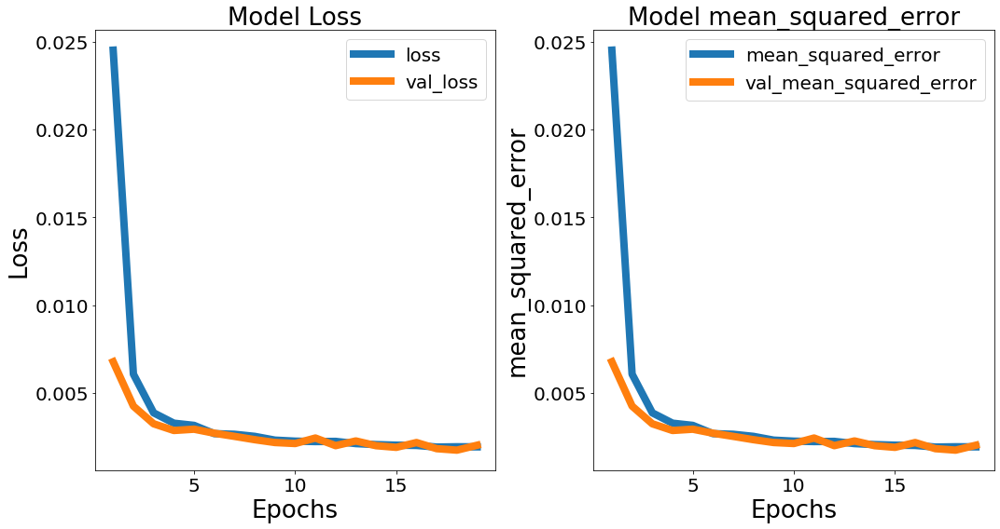

Epoch 00019: early stopping
Wall time: 38min


(<keras.engine.training.Model at 0x19ba8d27ba8>,
 <keras.callbacks.History at 0x19ba94b1ba8>)

In [44]:
%%time

f = [16, 32, 64, 128, 256]
model = UNET((256,256,3),f, activation ='relu')
model.compile(optimizer="adam", 
              loss="mse",  
              metrics=["mse"])

train_net(model, train_w_noise_generator, validation_w_noise_generator,
         epochs=50, saveBest = True,
             verbose=1, patience=2,metric = 'mse')

Loaded trained model from saved_models\unet_20190823-164841.h5 
8/8 [==============================] - 1s 78ms/step
Model Accuracy = 0.002008
Model Loss = 0.002008 


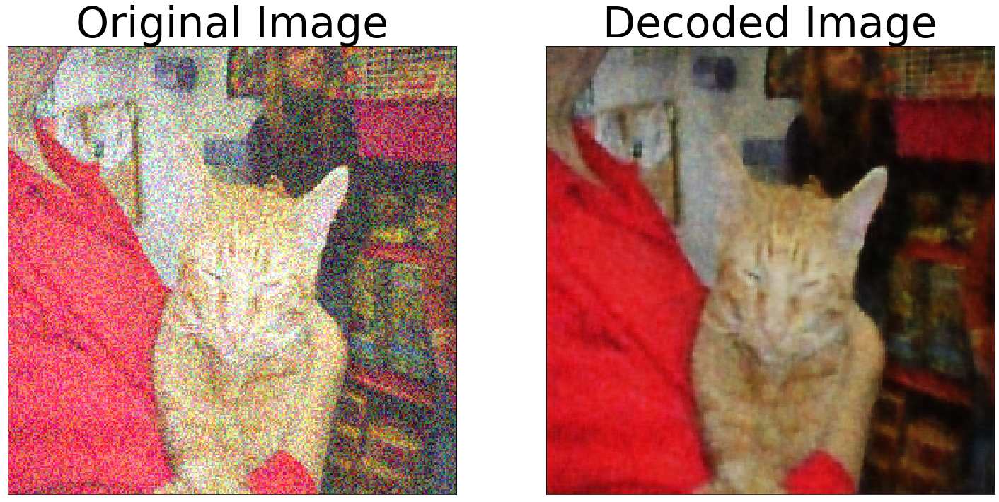

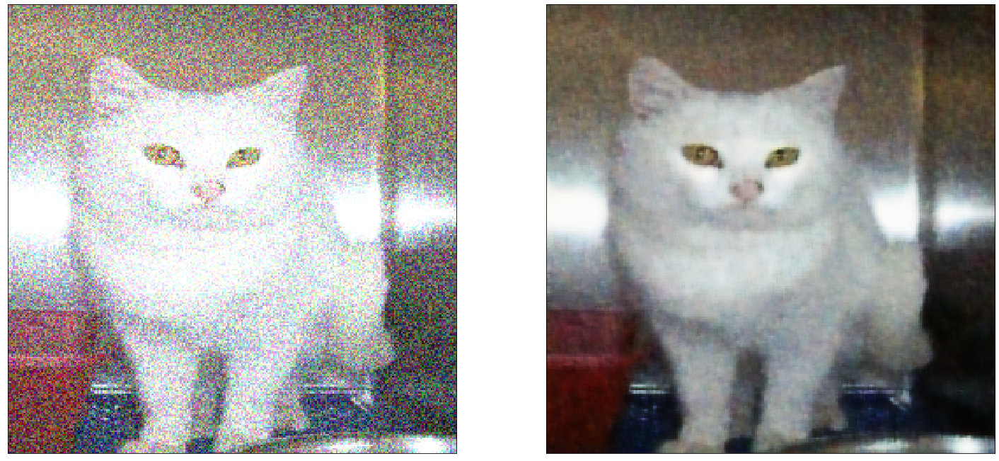

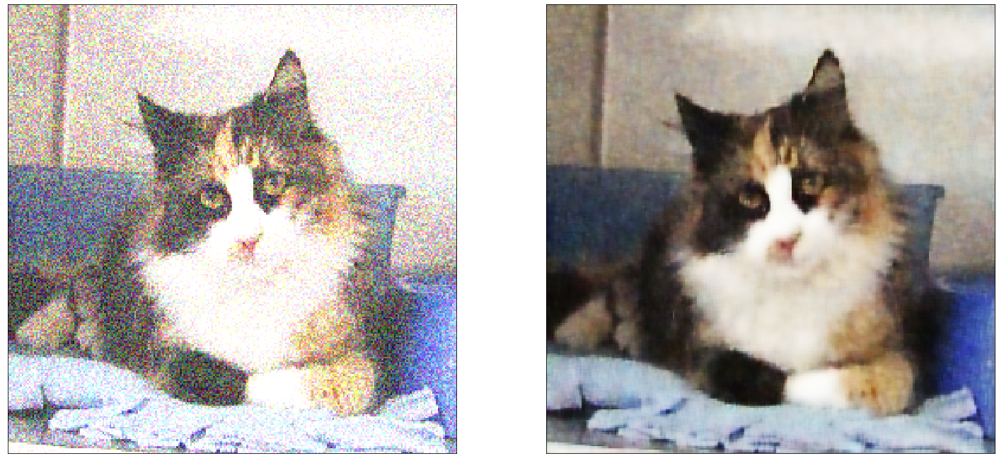

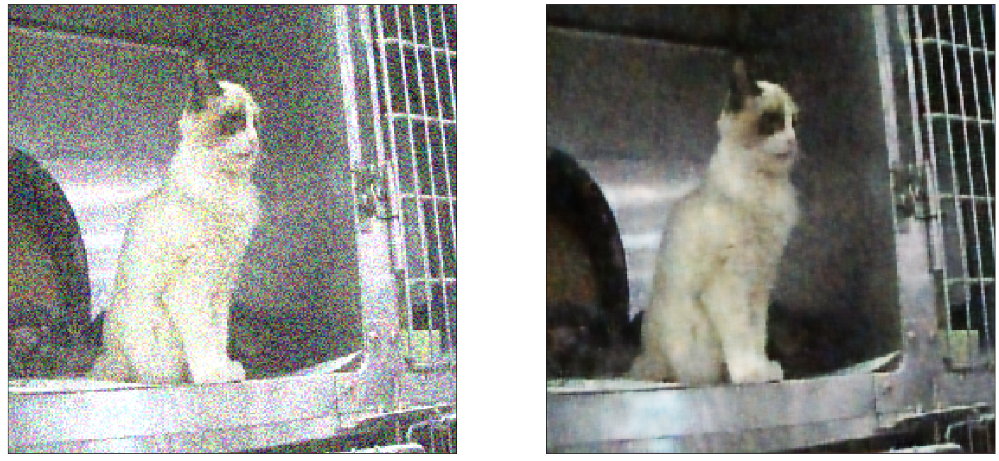

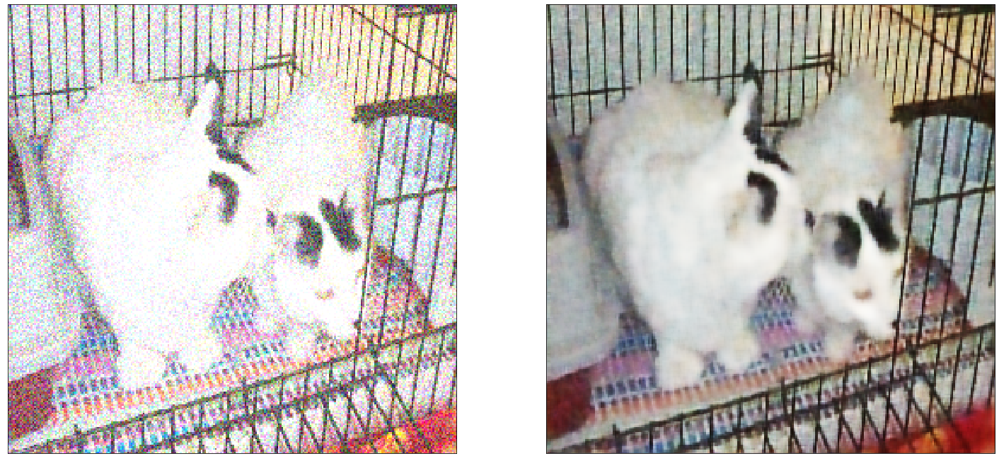

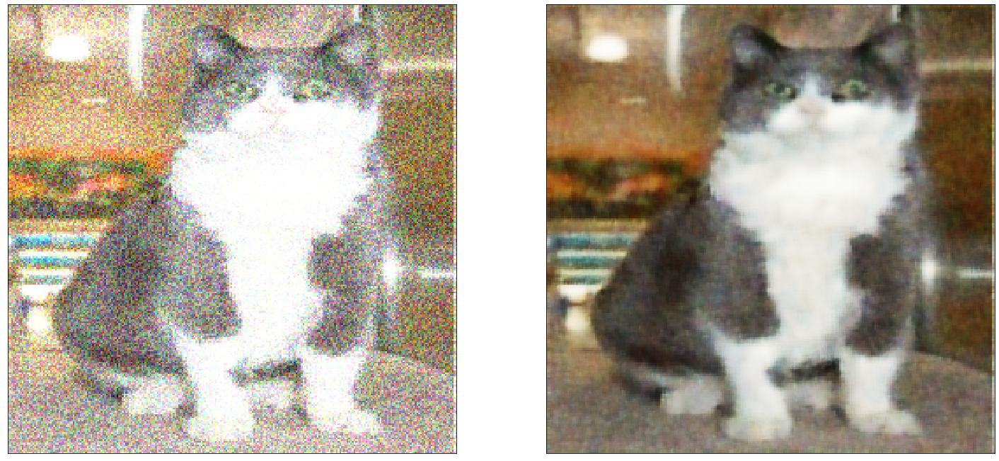

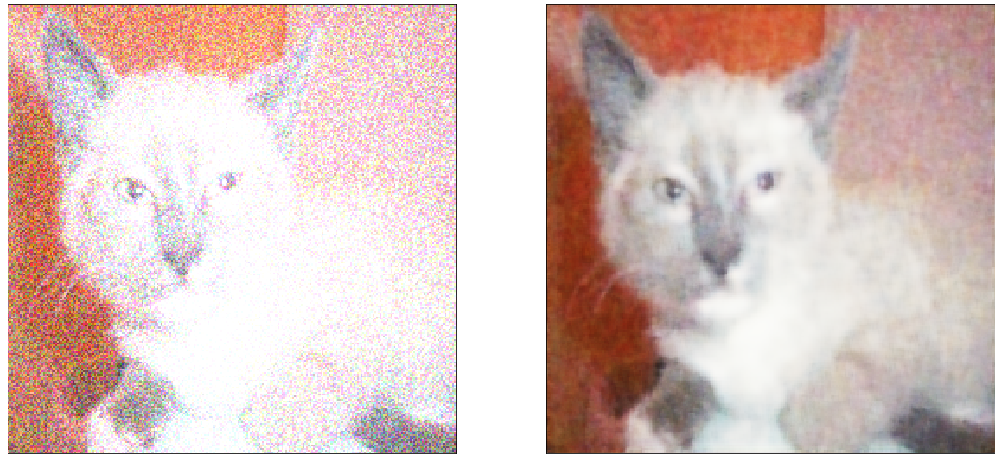

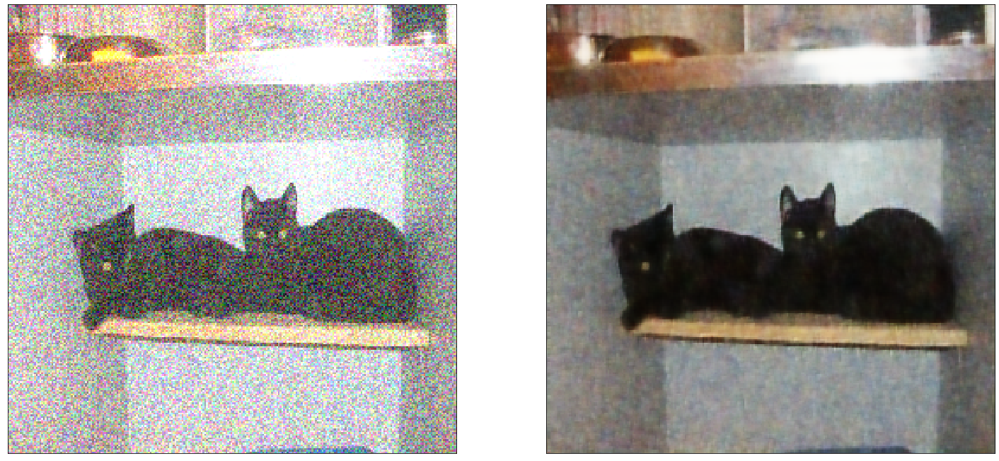

In [23]:
model = loadmodel('unet_20190823-164841.h5')

#Loss and acc of the model
evaluate_model(model, test_w_noise_generator)

#View the results of compression and decompression
test_model(model, test_w_noise_generator)